# Time to inspect

In [1]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

12
| 0.00, 0.00, 111.03|
| 0.00,-0.00,-2.66|
| 0.00, 0.00, 1.00|
Band 1


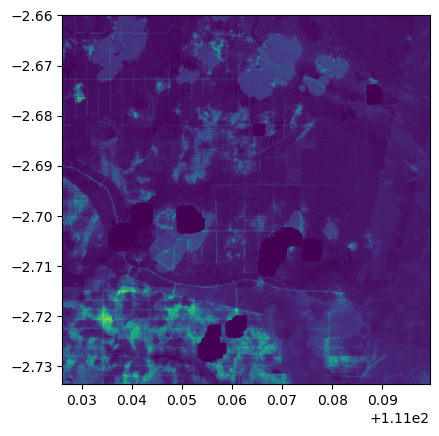

Band 2


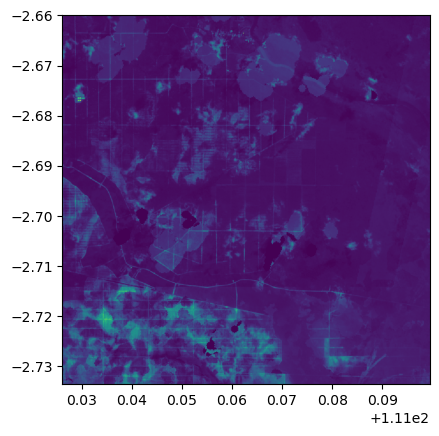

Band 3


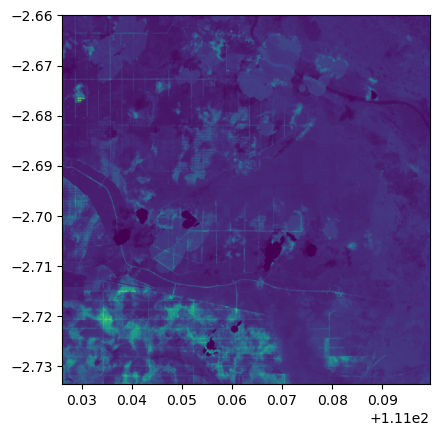

Band 4


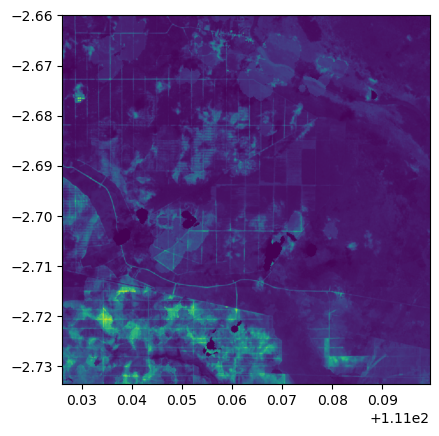

Band 5


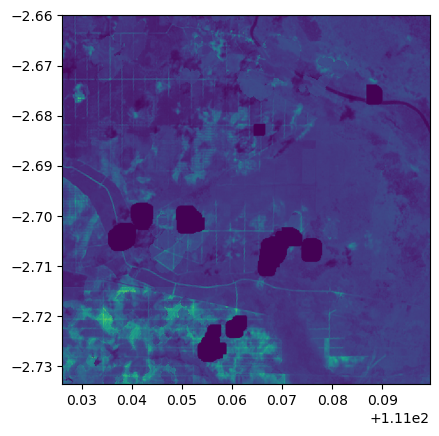

Band 6


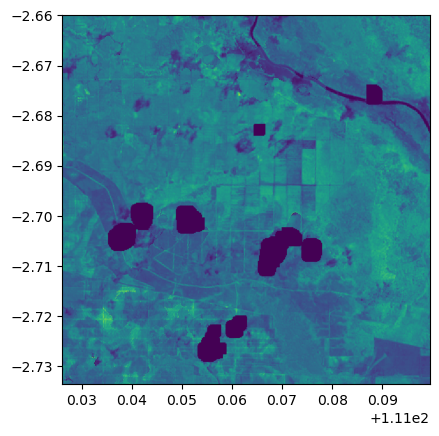

Band 7


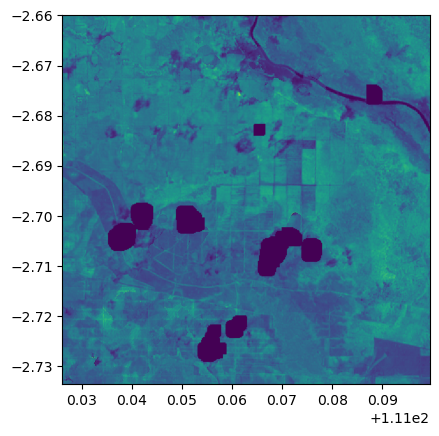

Band 8


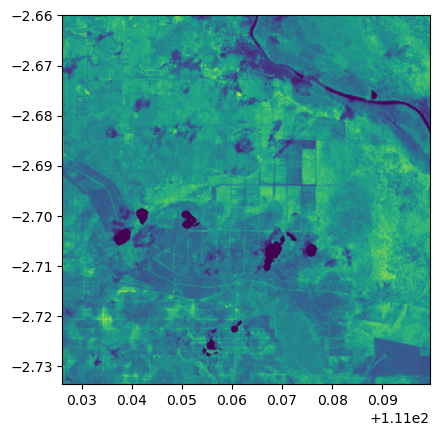

Band 9


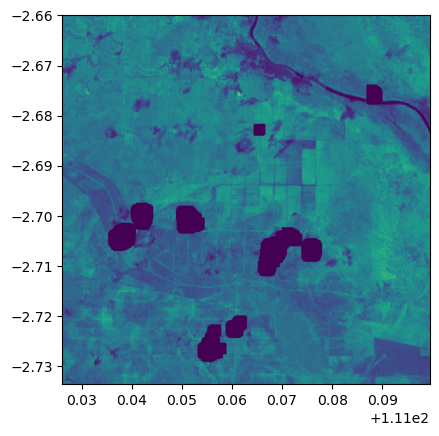

Band 10


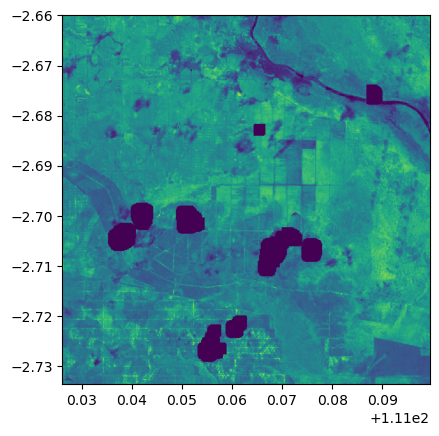

Band 11


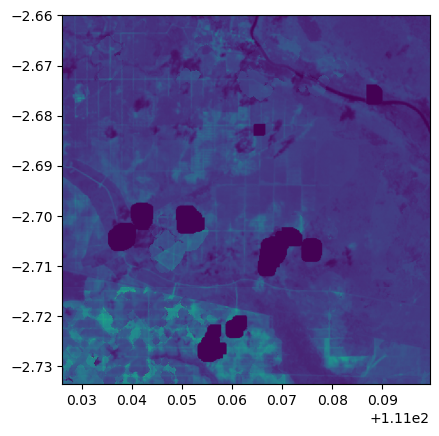

Band 12


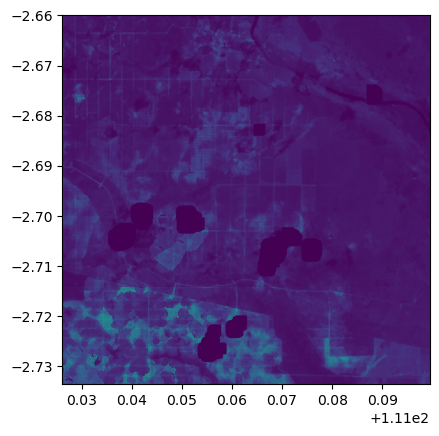

In [2]:
# Suppose all 12 bands are in one multi-band TIFF, e.g. "sentinel2_mosaic.tif"
with rasterio.open("./../testfolder/superresolved_10m.tif") as src:
    print(src.count)          # Number of bands (should be 12 if all in one file)
    print(src.transform)      # Affine transform (georeferencing)
    
    for i in range(1, src.count + 1): 
        # Read a single band (for example, band 4 = Red)
        bandi = src.read(i)
        print("Band", i)
        # Quick visualization of a single band
        show(bandi, transform=src.transform)

    # Quick RGB plot
    # Rasterio expects (band, row, column), so if you read in [4,3,2], 
    # it's shape = (3, height, width)
    # Transpose it to (height, width, band) for plt.imshow()

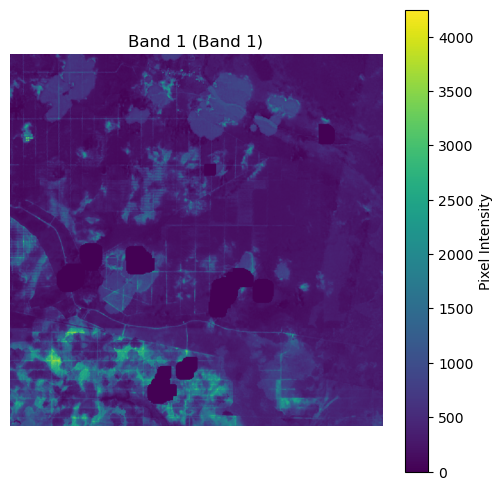

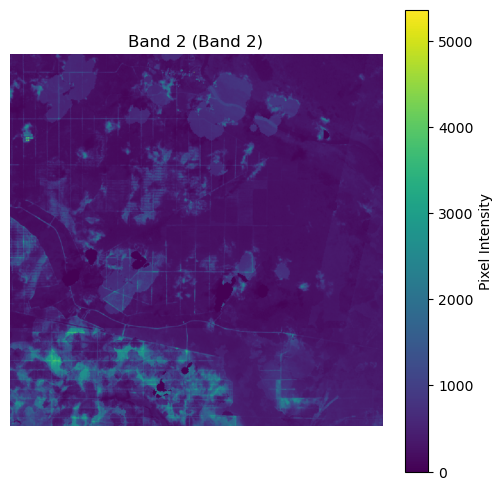

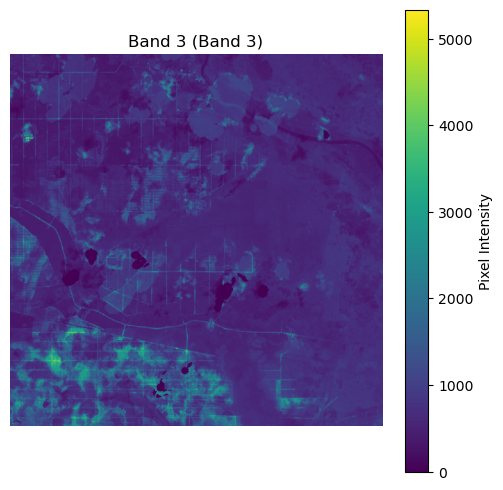

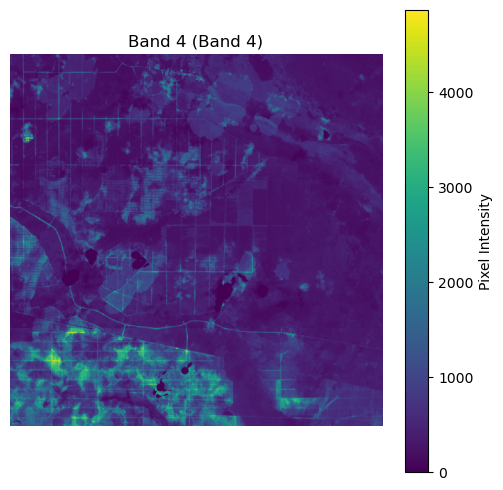

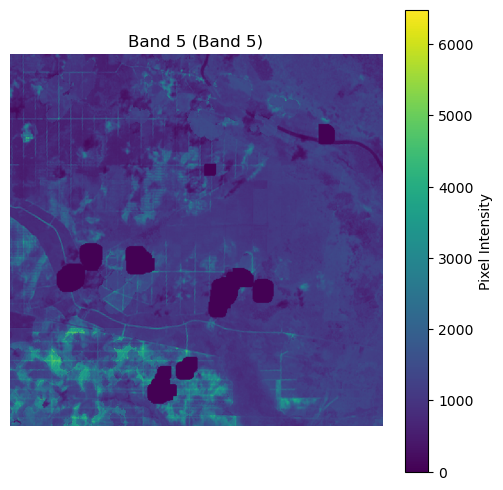

...

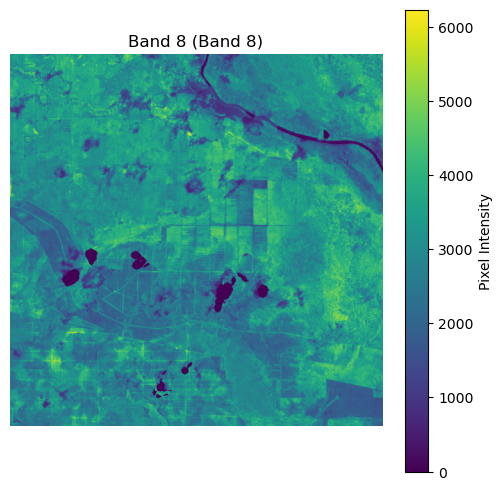

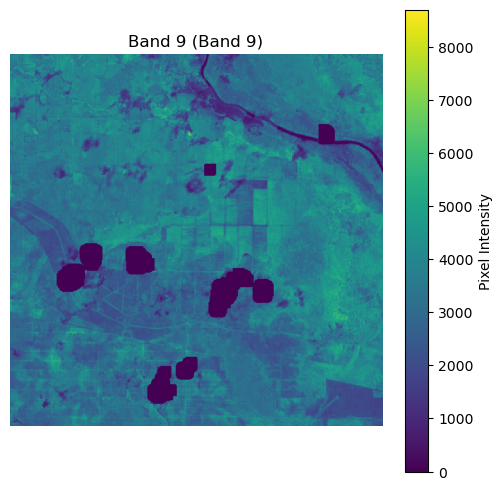

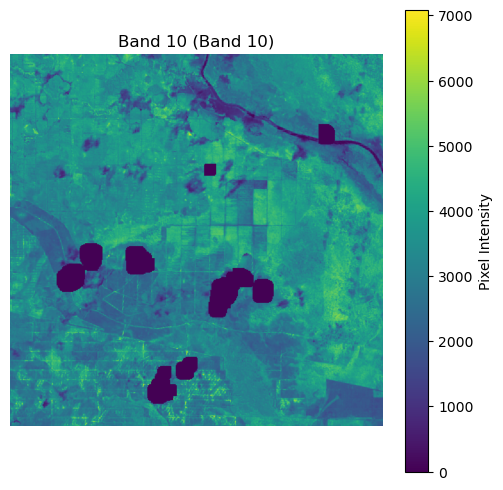

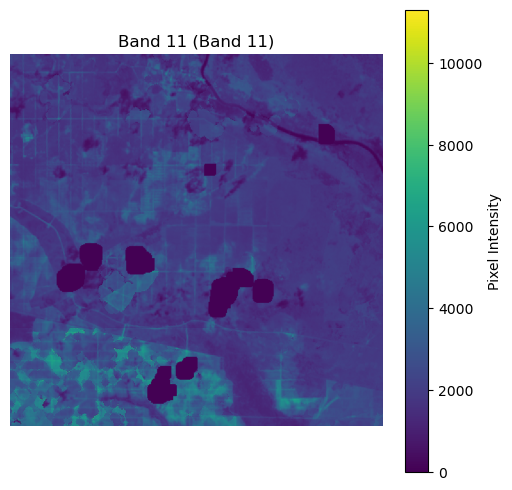

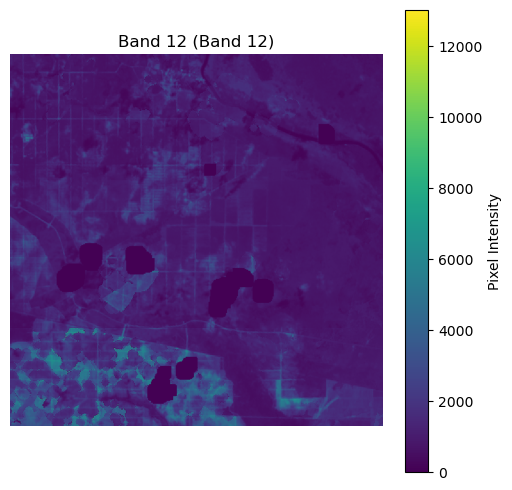

In [3]:
# Load the TIF file and visualize bands and RGB
with rasterio.open("./../testfolder/superresolved_10m.tif") as src:
    # Read all bands into a numpy array
    bands_data = src.read()
    profile = src.profile

# Visualize individual bands
def plot_band(band, index, title):
    plt.figure(figsize=(6, 6))
    plt.imshow(band)
    plt.title(f"{title} (Band {index})")
    plt.axis("off")
    plt.colorbar(label="Pixel Intensity")
    plt.show()

# Display each band individually
for i, band in enumerate(bands_data, start=1):
    plot_band(band, i, f"Band {i}")

In [5]:
import torch
import rasterio
import numpy as np

def load_tif_as_tensor(path):
    with rasterio.open(path) as src:
        img = src.read()  # Shape: [bands, height, width]
        img = np.array(img, dtype=np.float32)
    return torch.from_numpy(img)

def compute_rmse(x: torch.Tensor, y: torch.Tensor, mask_nan=True, mask_zero=True) -> torch.Tensor:
    assert x.shape == y.shape, "Shape mismatch"
    valid = torch.ones_like(x, dtype=torch.bool)
    if mask_nan:
        valid &= ~torch.isnan(x)
        valid &= ~torch.isnan(y)
    if mask_zero:
        valid &= (x != 0) & (y != 0)
    rmse = torch.sqrt(((x - y) ** 2)[valid].mean())
    return rmse

# Example usage:
original_path = "./../data/train_images/train_0.tif"
sr_path = "./../testfolder/superresolved_10m.tif"

original = load_tif_as_tensor(original_path)
sr = load_tif_as_tensor(sr_path)

rmse = compute_rmse(original, sr)
print(f"RMSE: {rmse.item():.4f}")

RMSE: 137.6274


In [6]:
import rasterio
from rasterio.enums import Resampling
import numpy as np
from pathlib import Path

def upsample_12band_tif(input_path: str, output_path: str):
    """
    Upsamples 20m and 60m bands from a 12-band Sentinel-2A .tif file to 10m using bilinear interpolation.
    Writes all bands into a new .tif at 10m resolution.
    """
    # Sentinel-2 band groupings (0-based index)
    bands_10m = [1, 2, 3, 7]           # B2, B3, B4, B8
    bands_20m = [4, 5, 6, 8, 10, 11]   # B5, B6, B7, B8A, B11, B12
    bands_60m = [0, 9]                 # B1, B9

    with rasterio.open(input_path) as src:
        profile = src.profile.copy()
        crs = src.crs
        transform_10m = src.transform
        width = src.width
        height = src.height

        # Allocate empty array for all 12 bands at 10m
        upsampled = np.zeros((12, height, width), dtype=np.uint16)

        # === Step 1: Copy 10m bands directly ===
        upsampled[bands_10m] = src.read(indexes=[b + 1 for b in bands_10m])

        # === Step 2: Upsample 20m bands to 10m ===
        for b in bands_20m:
            band_data = src.read(b + 1)
            scale_factor = 2  # 20m → 10m
            data_resampled = src.read(
                b + 1,
                out_shape=(height, width),
                resampling=Resampling.bilinear
            )
            upsampled[b] = data_resampled.astype(np.uint16)

        # === Step 3: Upsample 60m bands to 10m ===
        for b in bands_60m:
            band_data = src.read(b + 1)
            scale_factor = 6  # 60m → 10m
            data_resampled = src.read(
                b + 1,
                out_shape=(height, width),
                resampling=Resampling.bilinear
            )
            upsampled[b] = data_resampled.astype(np.uint16)

    # === Write final image ===
    profile.update({
        "height": height,
        "width": width,
        "transform": transform_10m,
        "count": 12,
        "dtype": "uint16"
    })

    with rasterio.open(output_path, "w", **profile) as dst:
        dst.write(upsampled)

    print(f"Saved bilinear upsampled 12-band .tif to: {output_path}")


In [7]:
upsample_12band_tif("./../data/train_images/train_0.tif", "train_0_bilinear_upsampled.tif")

C:\Users\chriz\AppData\Local\Temp\ipykernel_19092\2349496687.py:27: RuntimeWarning: invalid value encountered in cast
  upsampled[bands_10m] = src.read(indexes=[b + 1 for b in bands_10m])
C:\Users\chriz\AppData\Local\Temp\ipykernel_19092\2349496687.py:38: RuntimeWarning: invalid value encountered in cast
  upsampled[b] = data_resampled.astype(np.uint16)
C:\Users\chriz\AppData\Local\Temp\ipykernel_19092\2349496687.py:49: RuntimeWarning: invalid value encountered in cast
  upsampled[b] = data_resampled.astype(np.uint16)


Saved bilinear upsampled 12-band .tif to: train_0_bilinear_upsampled.tif


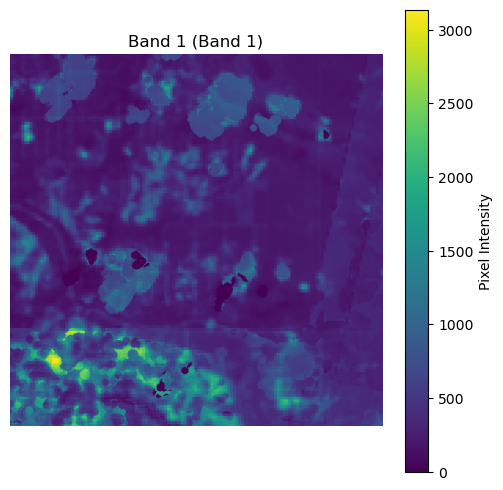

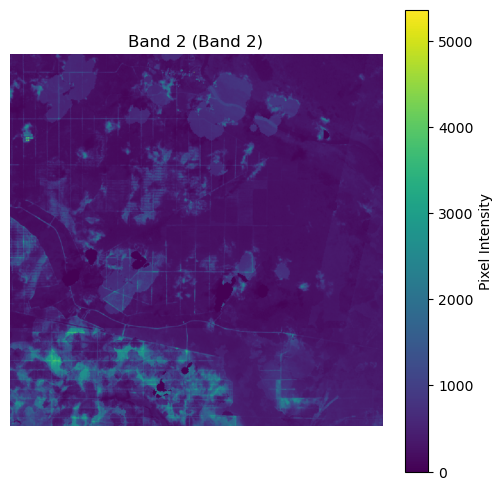

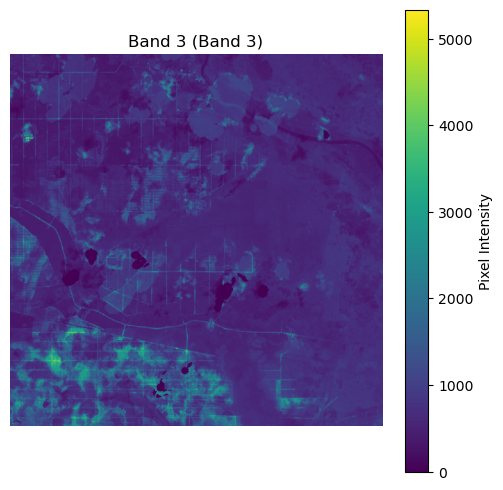

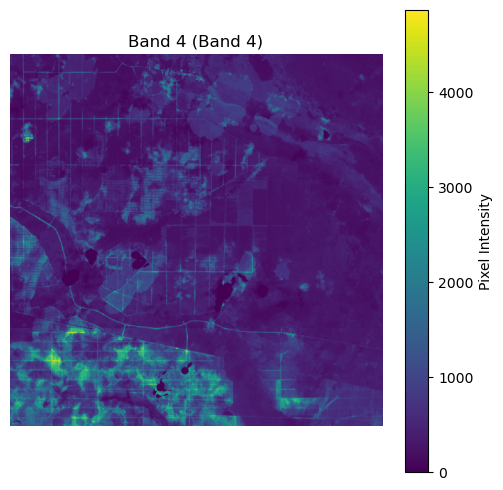

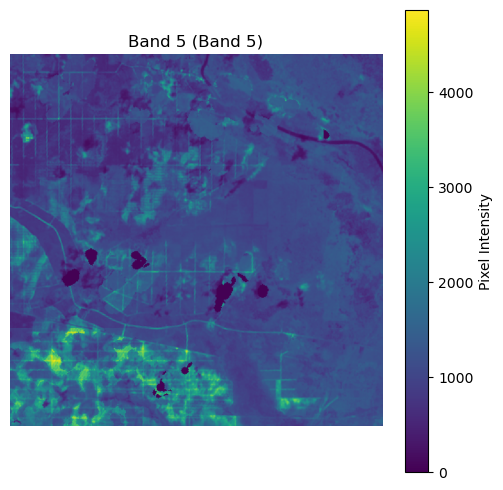

...

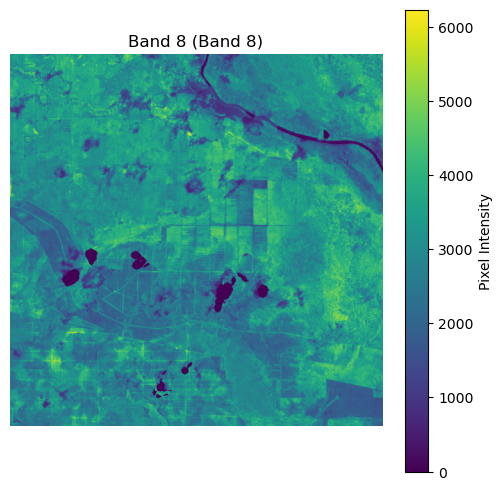

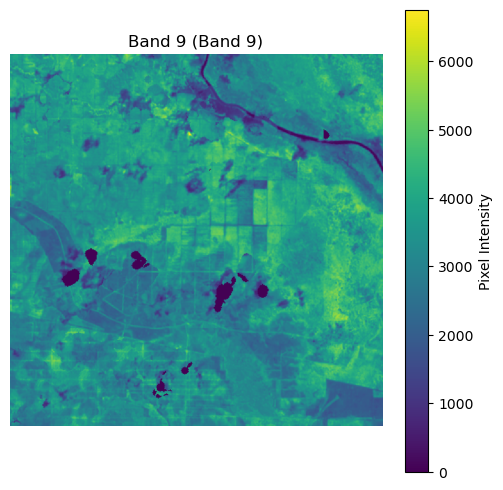

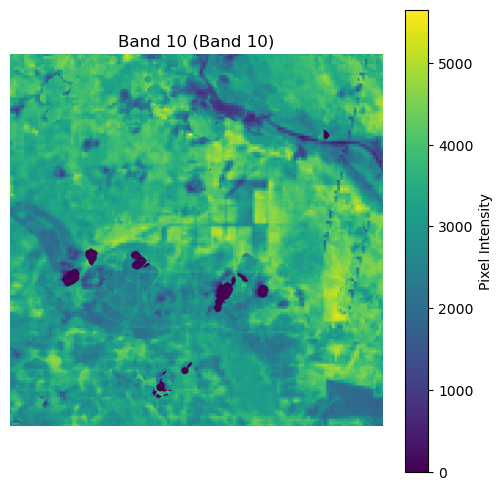

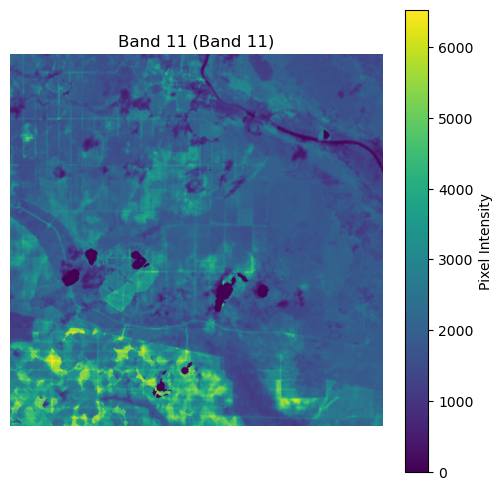

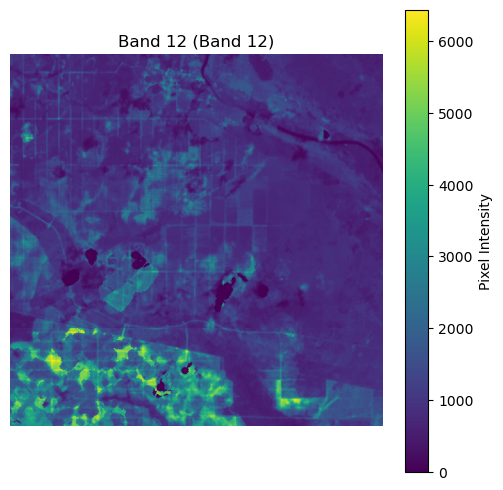

In [8]:
# Load the TIF file and visualize bands and RGB
with rasterio.open("./../testfolder/train_0_bilinear_upsampled.tif") as src:
    # Read all bands into a numpy array
    bands_data = src.read()
    profile = src.profile

# Visualize individual bands
def plot_band(band, index, title):
    plt.figure(figsize=(6, 6))
    plt.imshow(band)
    plt.title(f"{title} (Band {index})")
    plt.axis("off")
    plt.colorbar(label="Pixel Intensity")
    plt.show()

# Display each band individually
for i, band in enumerate(bands_data, start=1):
    plot_band(band, i, f"Band {i}")

In [9]:
# Example usage:
original_path = "./../data/train_images/train_0.tif"
sr_path = "./../testfolder/superresolved_10m.tif"
bi_path = "./../testfolder/train_0_bilinear_upsampled.tif"

original = load_tif_as_tensor(original_path)
sr = load_tif_as_tensor(sr_path)
bi = load_tif_as_tensor(bi_path)

sr_rmse = compute_rmse(original, sr)
bi_rmse = compute_rmse(original, bi)

print(f"RMSE sr: {rmse.item():.4f}")
print(f"RMSE bilinear: {bi_rmse.item():.4f}")

RMSE sr: 137.6274
RMSE bilinear: 0.1886
